In [1]:
#Nhập các thư viện cần thiết

import matplotlib.pyplot as plt
from keras.layers import LeakyReLU
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, Flatten, Flatten
from keras.utils import to_categorical
from keras.models import load_model
from keras.utils import load_img, img_to_array
import os
from keras.preprocessing.image import ImageDataGenerator

In [2]:
# Tăng cường dữ liệu (data augmentation) , 

# zoom_range: thực hiện zoom ngẫu nhiên trong phạm vi 0.2
# rescale: Scale lại với tỉ lệ 1/255
#	rotation_range: Xoay ảnh góc 0.2 độ

train_data=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

In [3]:
# tạo ra một đối tượng dữ liệu đào tạo (training dataset) từ các hình ảnh trong thư mục 
train_set=train_data.flow_from_directory('/content/drive/MyDrive/Datacuoiki/Train',target_size=(150,150), batch_size=32, class_mode='categorical')

Found 9794 images belonging to 9 classes.


In [4]:
# Liên kết Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:

train_set.class_indices

{'Bo dat': 0,
 'Bo ngua': 1,
 'Bo rua': 2,
 'Buom': 3,
 'Chuong chuong': 4,
 'Kien': 5,
 'Ong': 6,
 'Ruoi': 7,
 'Ve sau': 8}

In [6]:
# Tạo ra mạng DNN để train mô hình


#Khởi tạo mô hình Sequential
model = Sequential()

# Thêm Convolutional Layer với filter size là 3x3 và input shape là 256x256 với 3 kênh màu RGB 
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(150,150,3)))

# Thêm MaxPooling Layer với kích thước là 2x2
model.add(MaxPooling2D(pool_size=(2, 2)))

# Thêm Convolutional Layer:
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Thêm Convolutional Layer:
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Thêm Convolutional Layer:
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Thêm Flatten Layer dung de lm phang cac đầu ra của lớp convolution thành một vector.
model.add(Flatten())

# Thêm Fully Connected Layer với 512 units    512 units (neurons)
model.add(Dense(512, activation='relu'))

# Thêm output layer với softmax activation và 9 classes (nhận dạng 9 loài vật)
model.add(Dense(9, activation='softmax'))




#Compile
model.compile(loss='categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [7]:
#Áp dụng data augmentation cho tập dữ liệu huấn luyện
train_datagen = ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2,
                                   horizontal_flip=True)

# Load data tu thu muc gan day
train_generator = train_datagen.flow_from_directory(
        '/content/drive/MyDrive/Datacuoiki/Train',  # Duong dan den thu muc train
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical')
# Áp dụng data augmentation cho tập dữ liệu thử nghiệm
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        '/content/drive/MyDrive/Datacuoiki/Test',
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical')

Found 9794 images belonging to 9 classes.
Found 0 images belonging to 0 classes.


In [8]:
# Huấn luyện mô hình trên tập dữ liệu trong vòng 20 epochs
train=model.fit(
        train_generator,
        steps_per_epoch=300,
        epochs=20,
        validation_data=test_generator,
        validation_steps=400)

Epoch 1/20
300/300 [==============================] - 3111s 10s/step - loss: 1.5130 - accuracy: 0.4569
Epoch 2/20
300/300 [==============================] - 693s 2s/step - loss: 0.9106 - accuracy: 0.6881
Epoch 3/20
300/300 [==============================] - 678s 2s/step - loss: 0.6695 - accuracy: 0.7755
Epoch 4/20
300/300 [==============================] - 673s 2s/step - loss: 0.5091 - accuracy: 0.8342
Epoch 5/20
300/300 [==============================] - 671s 2s/step - loss: 0.4337 - accuracy: 0.8566
Epoch 6/20
300/300 [==============================] - 665s 2s/step - loss: 0.3373 - accuracy: 0.8869
Epoch 7/20
300/300 [==============================] - 663s 2s/step - loss: 0.3169 - accuracy: 0.8951
Epoch 8/20
300/300 [==============================] - 668s 2s/step - loss: 0.2439 - accuracy: 0.9160
Epoch 9/20
300/300 [==============================] - 667s 2s/step - loss: 0.2011 - accuracy: 0.9351
Epoch 10/20
300/300 [==============================] - 662s 2s/step - loss: 0.2044 - accu

In [14]:
# Đánh giá độ chính xác của mô hình 
Score=model.evaluate(train_generator,verbose=1)
print('Train Loss', Score[0])
print('Train Accuracy', Score[1])

307/307 [==============================] - 299s 974ms/step - loss: 0.0761 - accuracy: 0.9756
Train Loss 0.07609332352876663
Train Accuracy 0.9755973219871521


In [9]:
#  Luu mô hình dưới dạng file 
model.save("/content/drive/MyDrive/Training.h5")

In [10]:
#tải mô hình đã được lưu trữ trước đó từ đường dẫn
model_1=load_model('/content/drive/MyDrive/Training.h5')

1/1 [==============================] - 0s 338ms/step
Bo rua


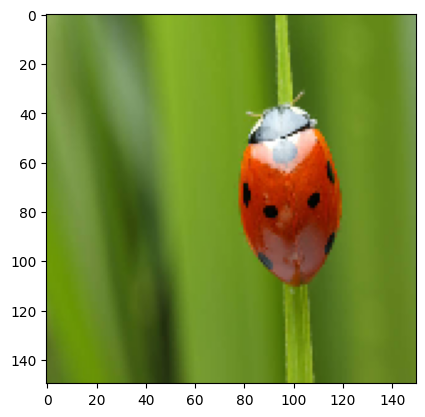

1/1 [==============================] - 0s 43ms/step
Bo rua


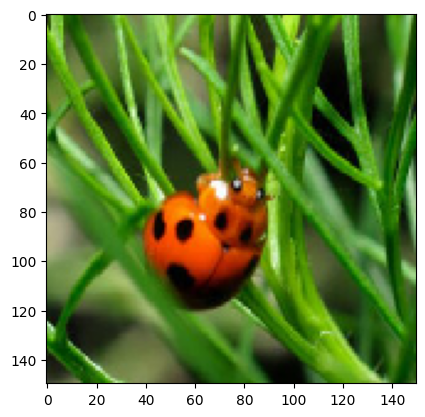

1/1 [==============================] - 0s 54ms/step
Bo rua


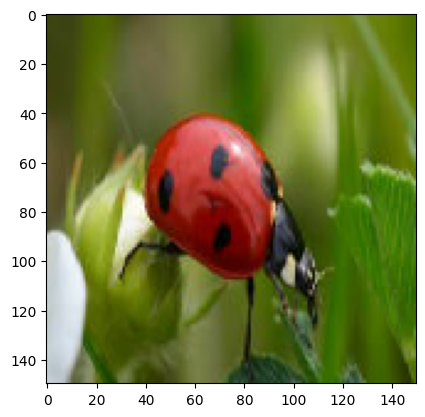

1/1 [==============================] - 0s 38ms/step
Bo rua


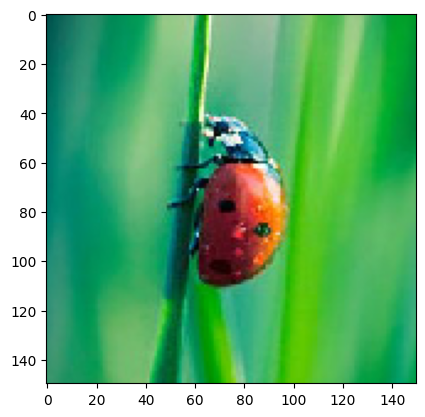

1/1 [==============================] - 0s 60ms/step
Bo rua


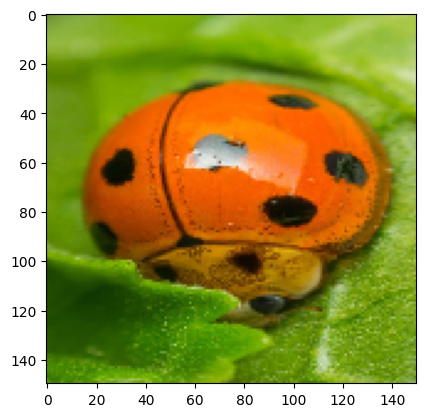

1/1 [==============================] - 0s 177ms/step
Bo rua


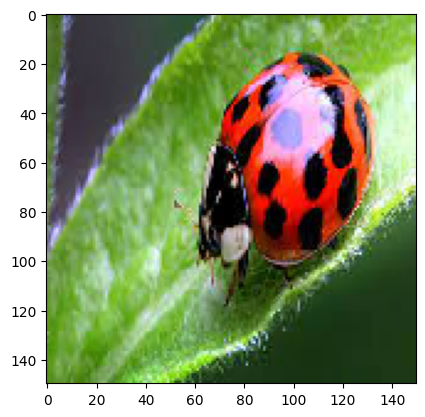

1/1 [==============================] - 0s 216ms/step
Kien


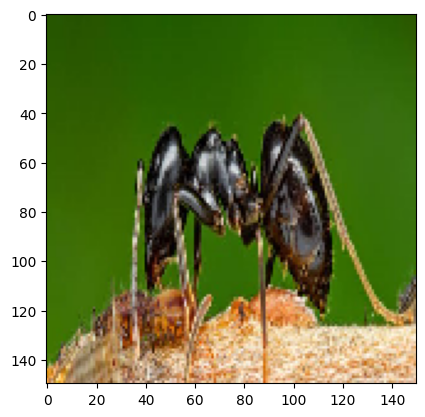

1/1 [==============================] - 0s 85ms/step
Chuong chuong


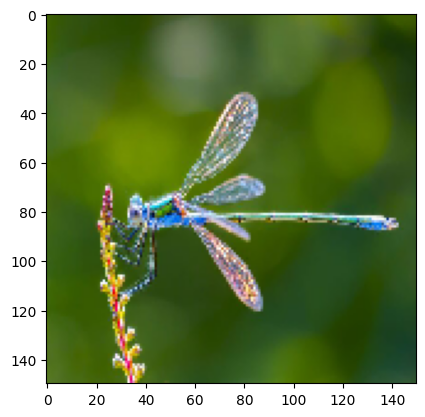

1/1 [==============================] - 0s 69ms/step
Chuong chuong


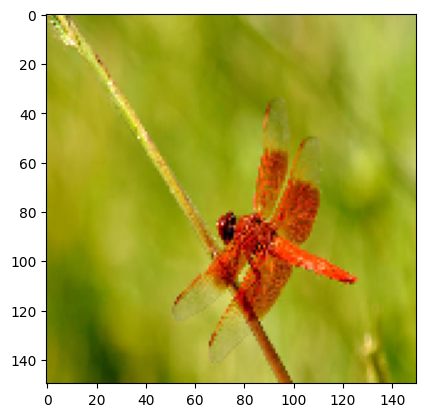

1/1 [==============================] - 0s 82ms/step
Chuong chuong


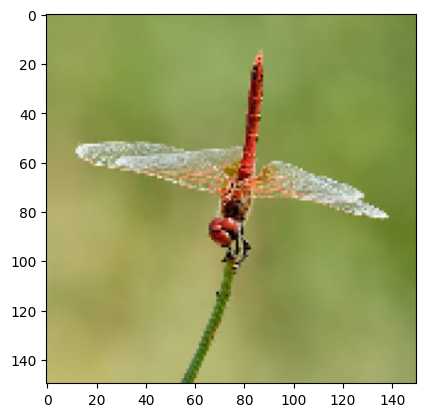

1/1 [==============================] - 0s 96ms/step
Bo rua


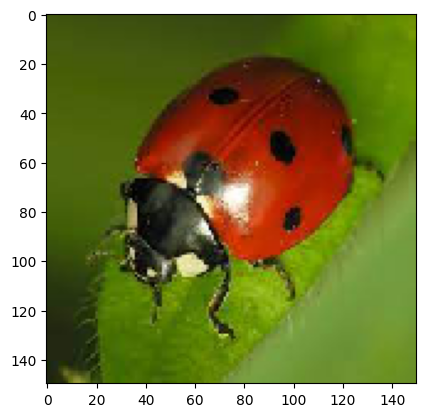

1/1 [==============================] - 0s 68ms/step
Bo rua


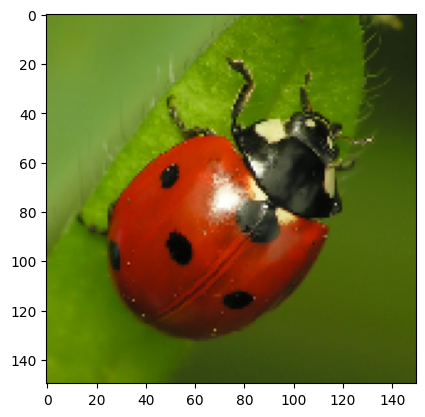

1/1 [==============================] - 0s 41ms/step
Bo rua


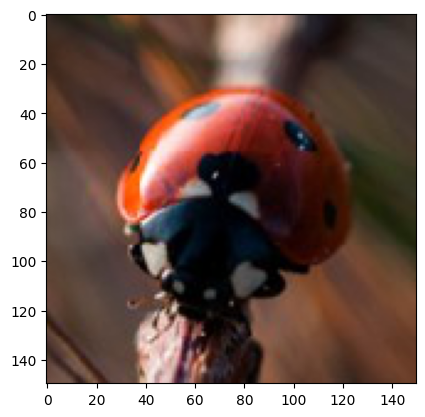

1/1 [==============================] - 0s 42ms/step
Kien


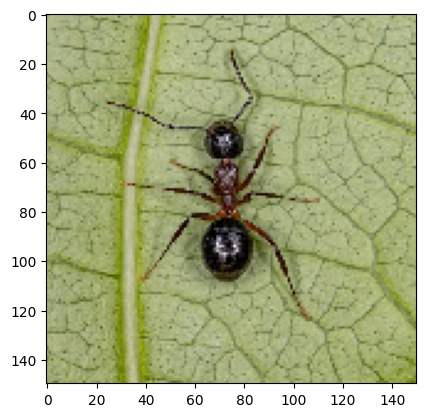

1/1 [==============================] - 0s 52ms/step
Kien


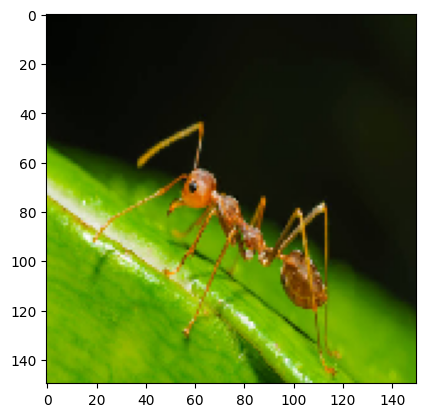

1/1 [==============================] - 0s 41ms/step
Buom


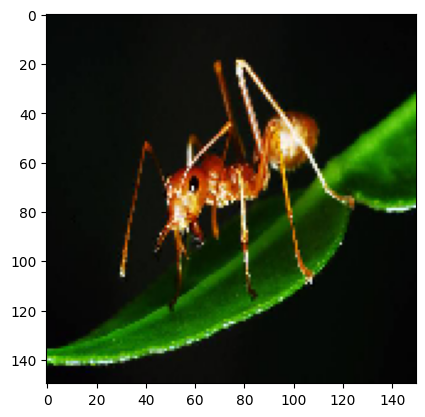

1/1 [==============================] - 0s 60ms/step
Kien


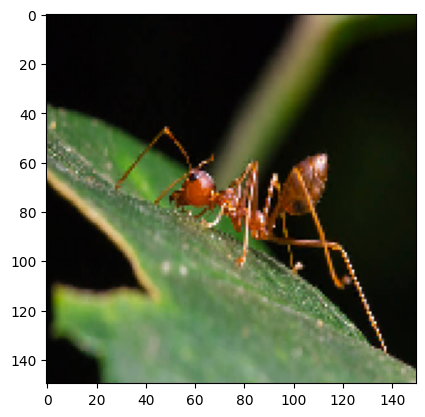

1/1 [==============================] - 0s 61ms/step
Kien


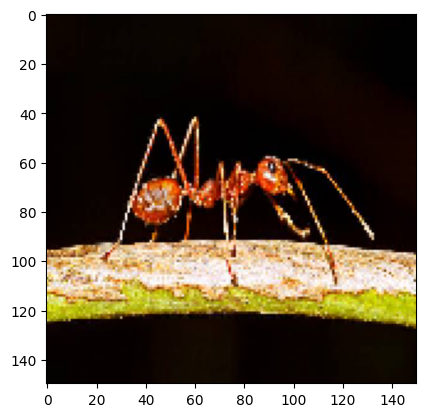

1/1 [==============================] - 0s 61ms/step
Bo rua


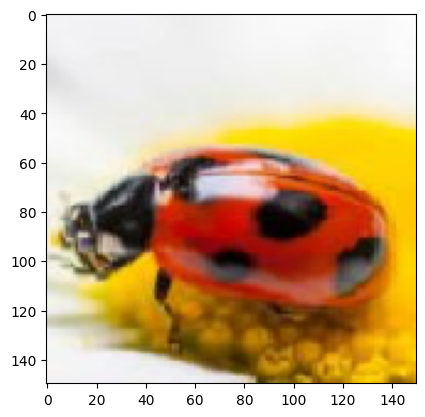

1/1 [==============================] - 0s 65ms/step
Chuong chuong


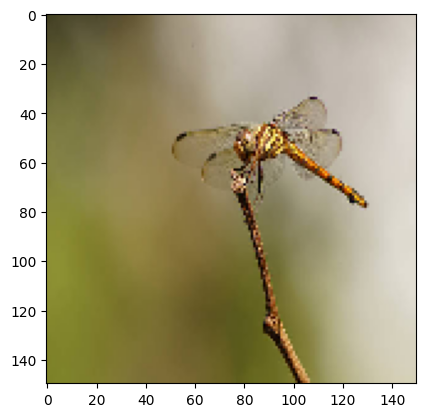

1/1 [==============================] - 0s 68ms/step
Chuong chuong


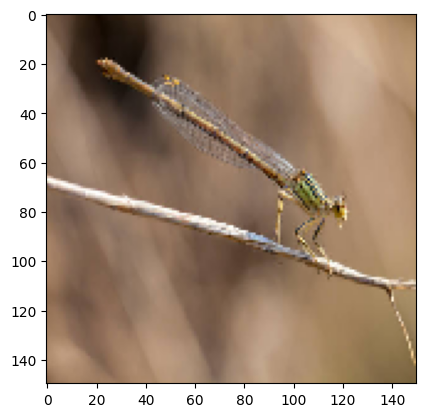

1/1 [==============================] - 0s 75ms/step
Chuong chuong


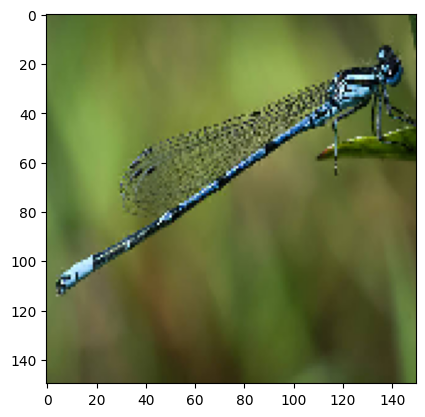

1/1 [==============================] - 0s 36ms/step
Chuong chuong


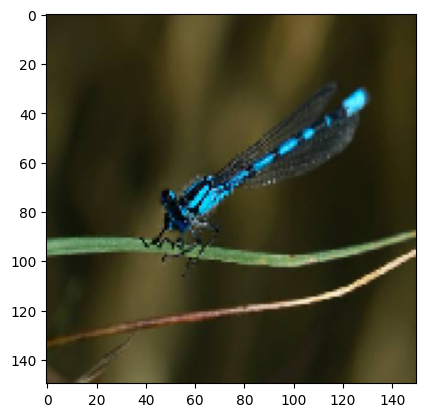

1/1 [==============================] - 0s 39ms/step
Chuong chuong


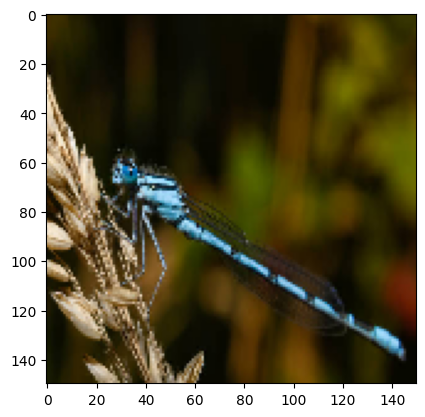

1/1 [==============================] - 0s 39ms/step
Chuong chuong


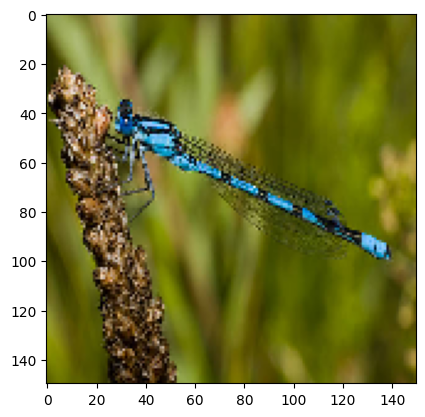

1/1 [==============================] - 0s 53ms/step
Chuong chuong


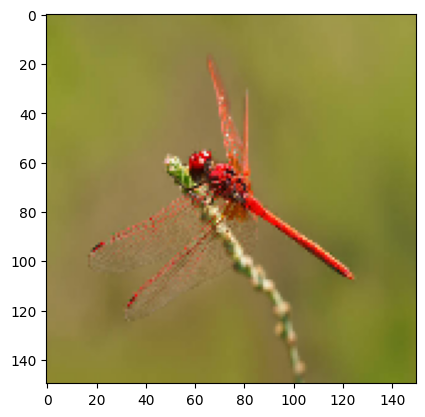

1/1 [==============================] - 0s 40ms/step
Chuong chuong


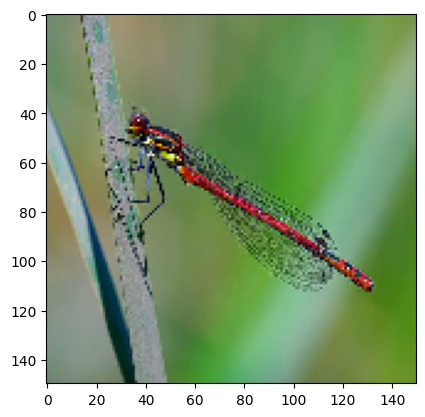

1/1 [==============================] - 0s 39ms/step
Ong


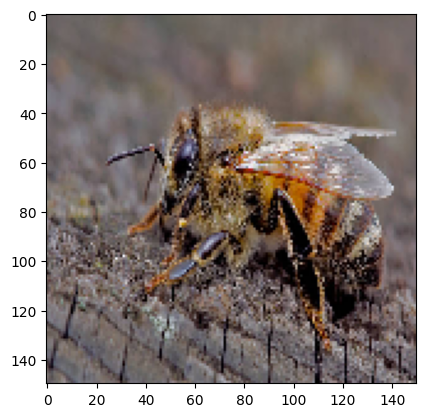

1/1 [==============================] - 0s 39ms/step
Ong


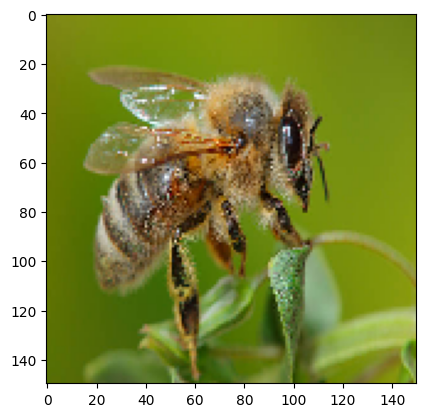

1/1 [==============================] - 0s 40ms/step
Ong


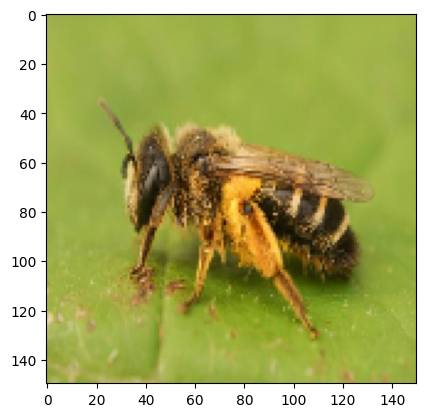

1/1 [==============================] - 0s 46ms/step
Ong


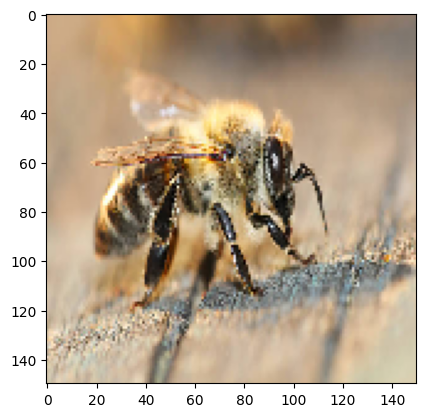

1/1 [==============================] - 0s 38ms/step
Ong


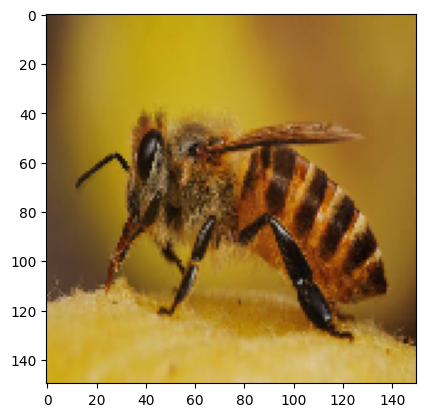

1/1 [==============================] - 0s 37ms/step
Ong


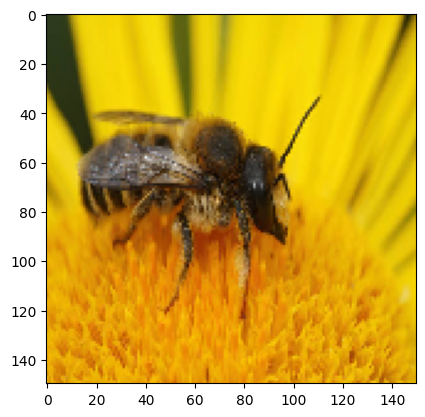

1/1 [==============================] - 0s 40ms/step
Bo rua


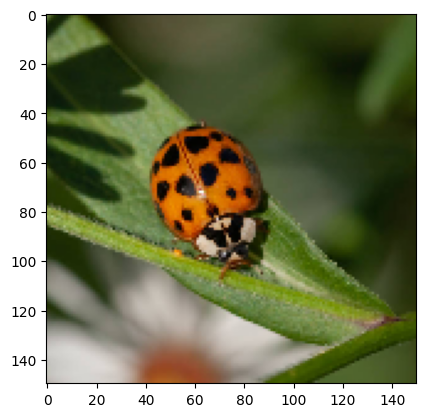

1/1 [==============================] - 0s 38ms/step
Bo rua


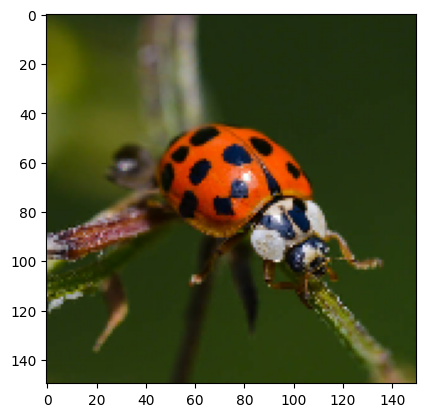

1/1 [==============================] - 0s 73ms/step
Bo rua


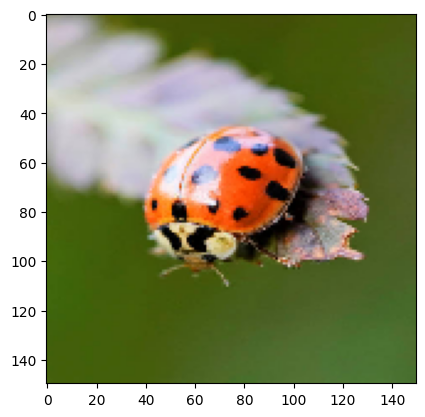

1/1 [==============================] - 0s 67ms/step
Bo rua


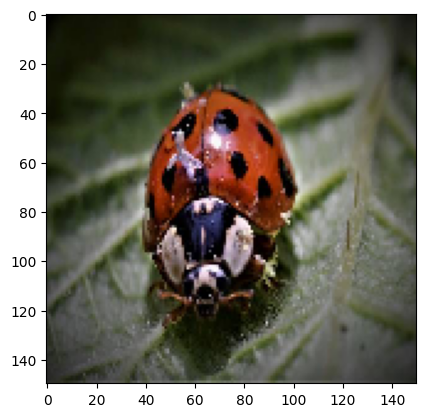

1/1 [==============================] - 0s 59ms/step
Buom


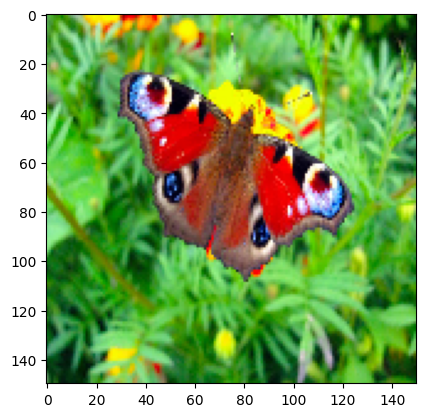

1/1 [==============================] - 0s 81ms/step
Buom


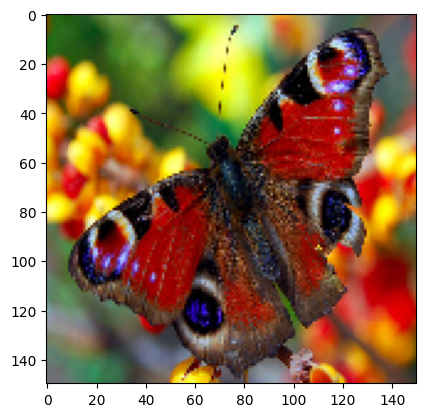

1/1 [==============================] - 0s 67ms/step
Buom


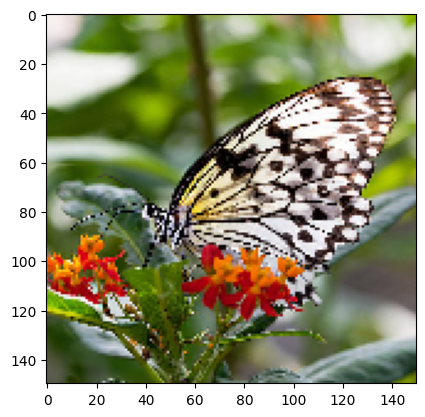

1/1 [==============================] - 0s 75ms/step
Buom


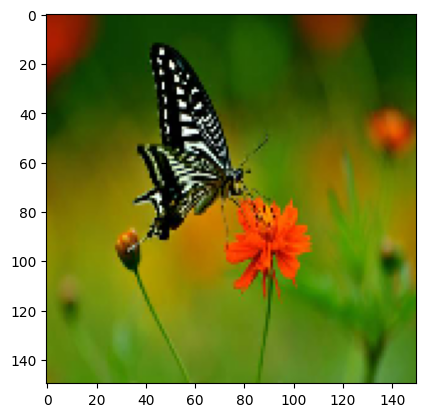

1/1 [==============================] - 0s 39ms/step
Buom


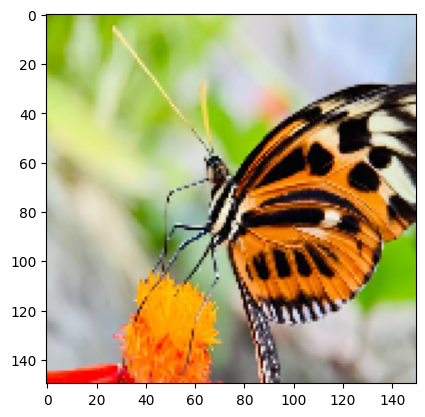

1/1 [==============================] - 0s 42ms/step
Buom


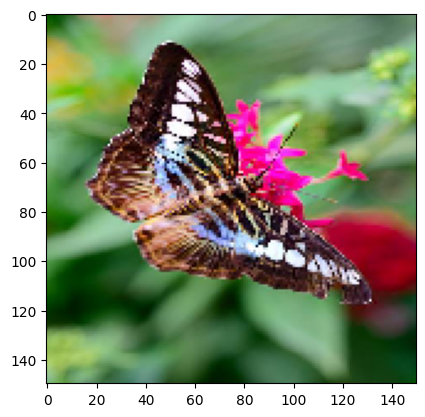

1/1 [==============================] - 0s 41ms/step
Buom


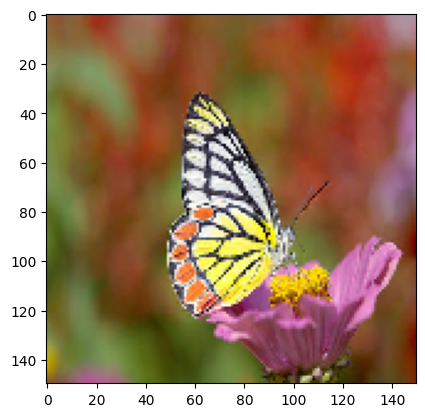

1/1 [==============================] - 0s 39ms/step
Buom


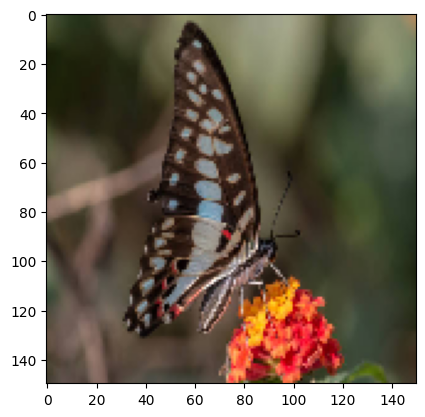

1/1 [==============================] - 0s 41ms/step
Buom


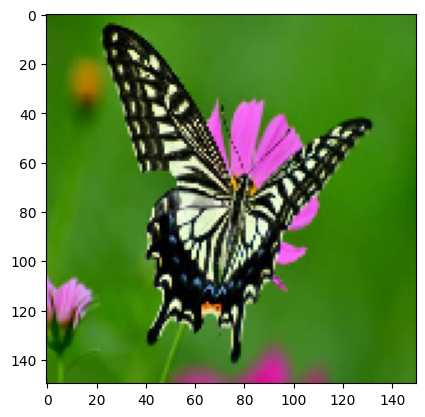

1/1 [==============================] - 0s 38ms/step
Buom


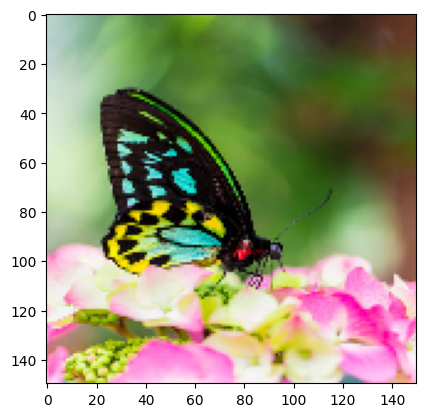

1/1 [==============================] - 0s 39ms/step
Buom


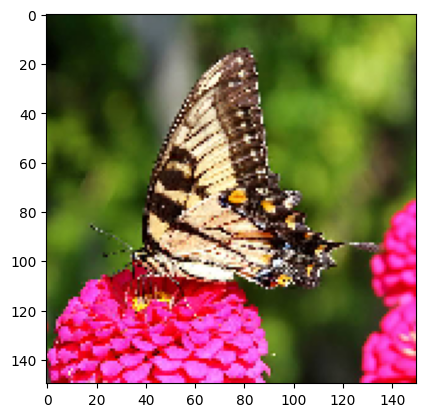

1/1 [==============================] - 0s 37ms/step
Buom


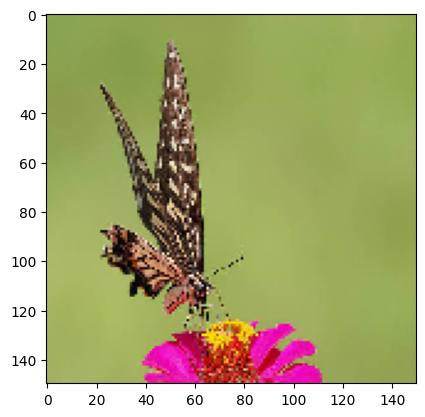

1/1 [==============================] - 0s 38ms/step
Buom


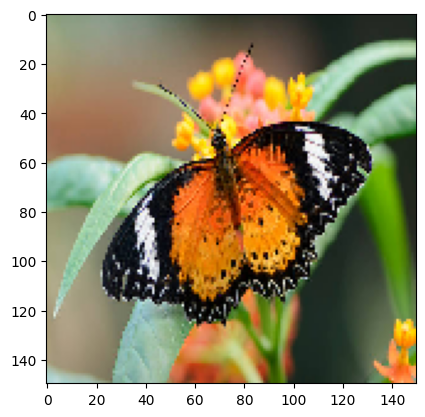

1/1 [==============================] - 0s 39ms/step
Buom


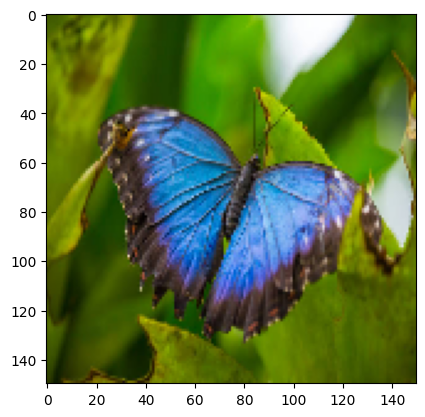

1/1 [==============================] - 0s 41ms/step
Buom


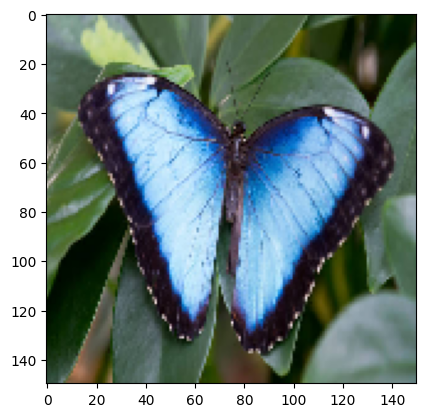

1/1 [==============================] - 0s 54ms/step
Buom


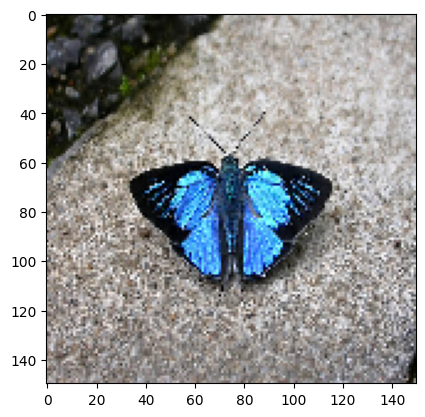

1/1 [==============================] - 0s 38ms/step
Buom


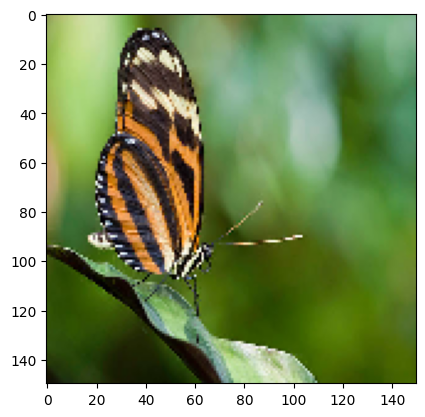

1/1 [==============================] - 0s 84ms/step
Buom


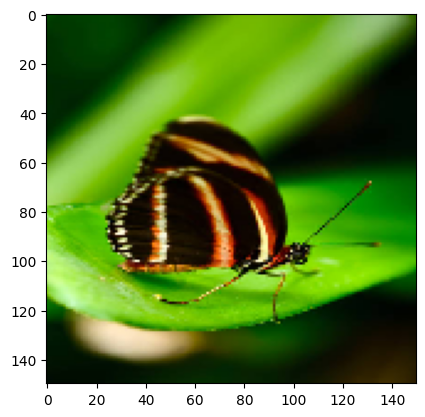

1/1 [==============================] - 0s 71ms/step
Chuong chuong


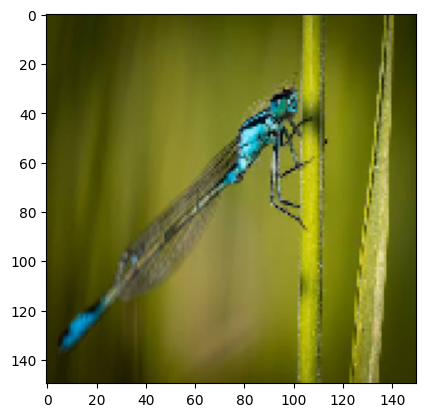

1/1 [==============================] - 0s 73ms/step
Ruoi


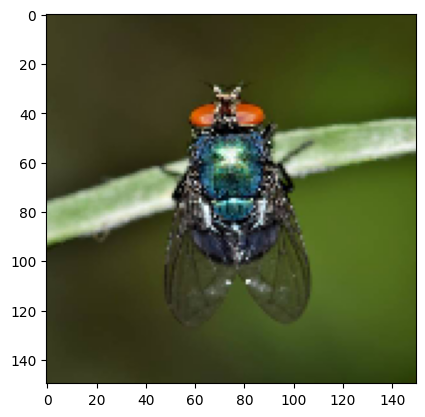

1/1 [==============================] - 0s 61ms/step
Ruoi


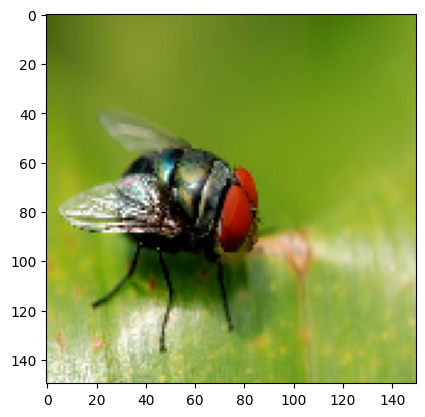

1/1 [==============================] - 0s 130ms/step
Ruoi


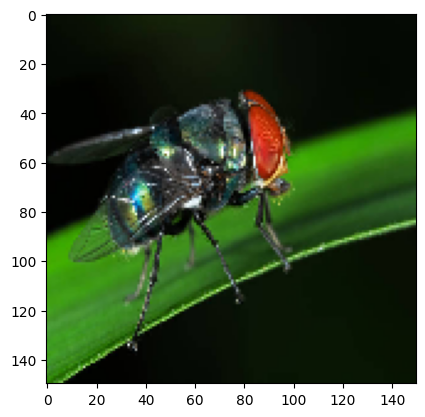

1/1 [==============================] - 0s 74ms/step
Ruoi


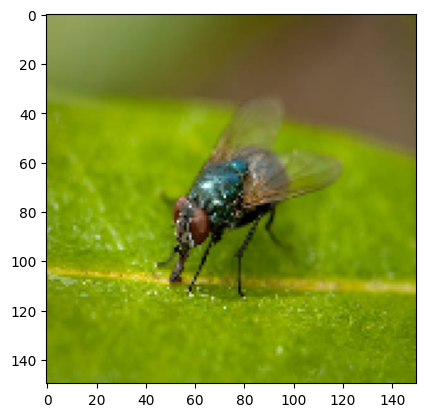

1/1 [==============================] - 0s 86ms/step
Ruoi


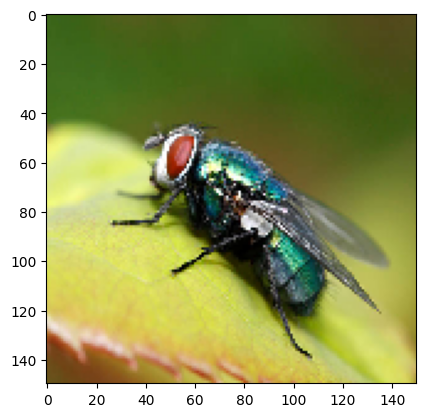

1/1 [==============================] - 0s 60ms/step
Ruoi


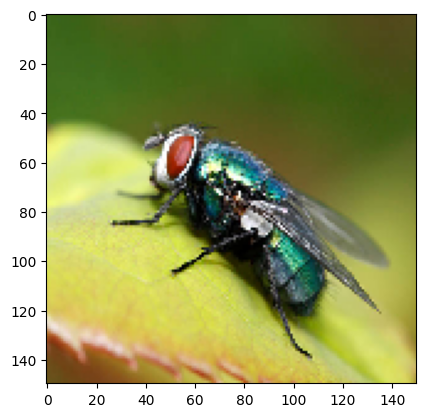

1/1 [==============================] - 0s 57ms/step
Bo ngua


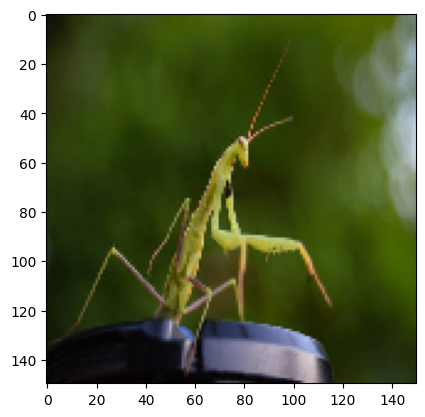

1/1 [==============================] - 0s 57ms/step
Bo ngua


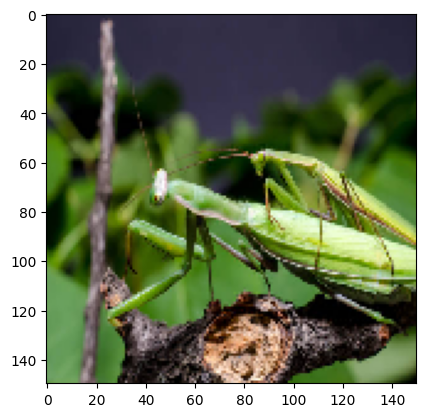

1/1 [==============================] - 0s 57ms/step
Bo ngua


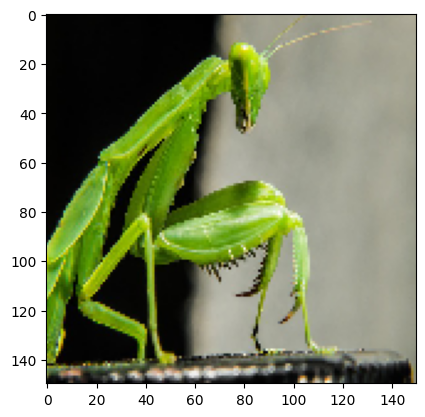

1/1 [==============================] - 0s 67ms/step
Bo ngua


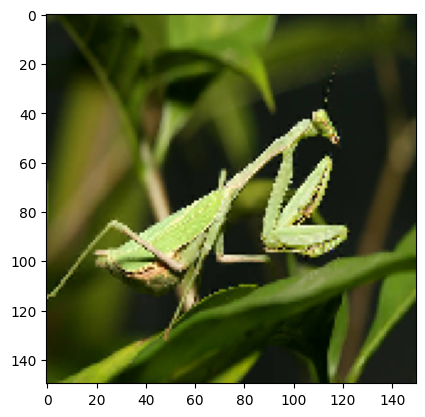

1/1 [==============================] - 0s 57ms/step
Bo ngua


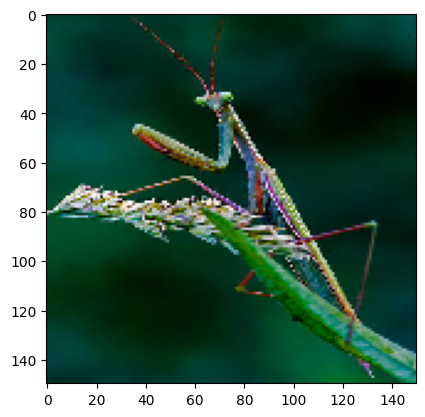

1/1 [==============================] - 0s 54ms/step
Bo dat


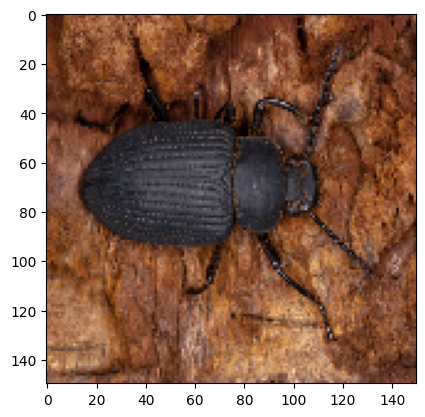

1/1 [==============================] - 0s 50ms/step
Bo dat


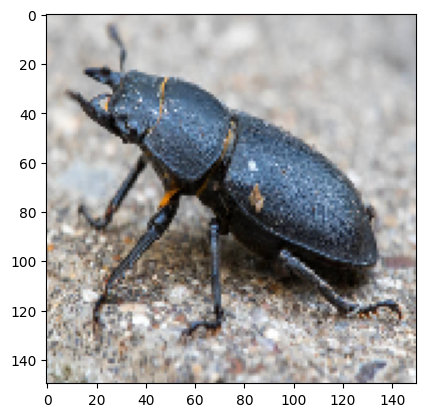

1/1 [==============================] - 0s 38ms/step
Bo dat


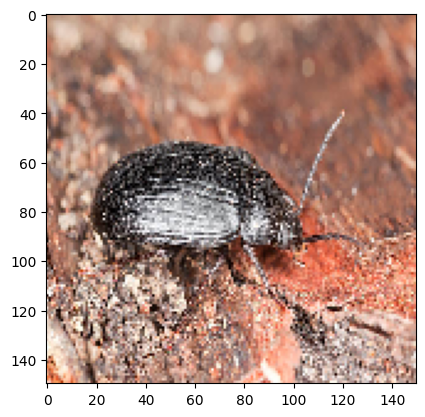

1/1 [==============================] - 0s 42ms/step
Bo dat


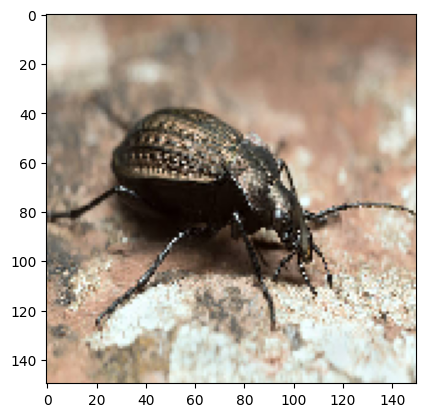

1/1 [==============================] - 0s 60ms/step
Bo dat


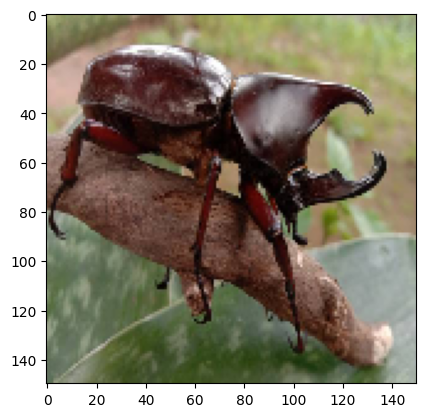

1/1 [==============================] - 0s 58ms/step
Bo dat


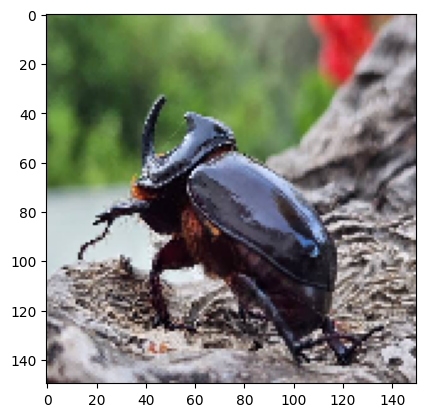

1/1 [==============================] - 0s 80ms/step
Bo dat


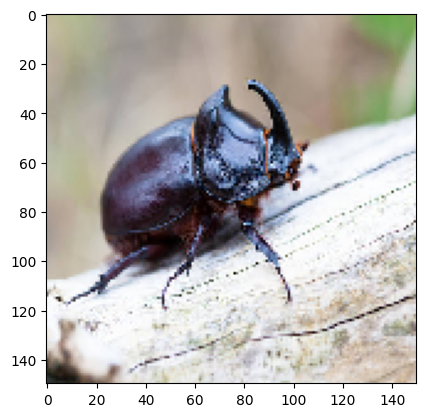

1/1 [==============================] - 0s 103ms/step
Bo dat


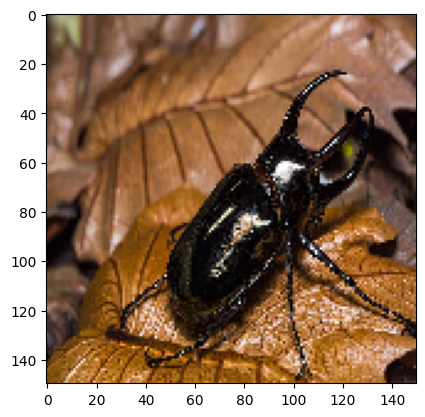

1/1 [==============================] - 0s 115ms/step
Bo dat


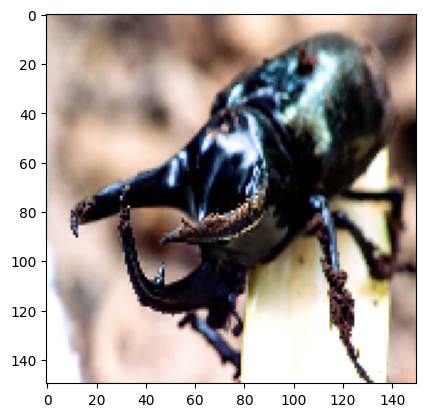

1/1 [==============================] - 0s 61ms/step
Ve sau


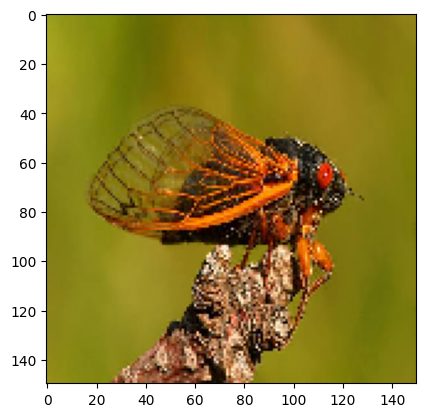

1/1 [==============================] - 0s 102ms/step
Ve sau


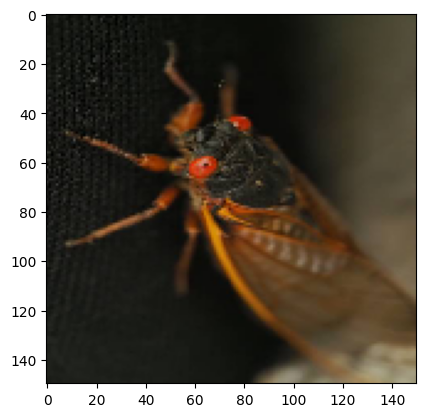

1/1 [==============================] - 0s 90ms/step
Ve sau


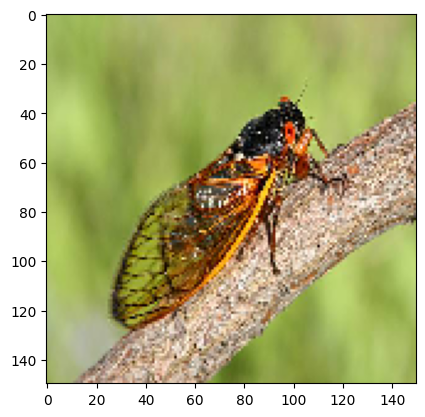

1/1 [==============================] - 0s 79ms/step
Ve sau


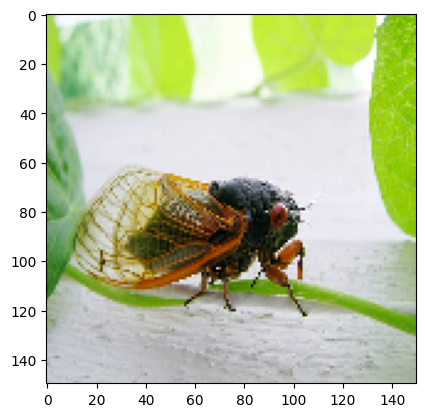

1/1 [==============================] - 0s 58ms/step
Ve sau


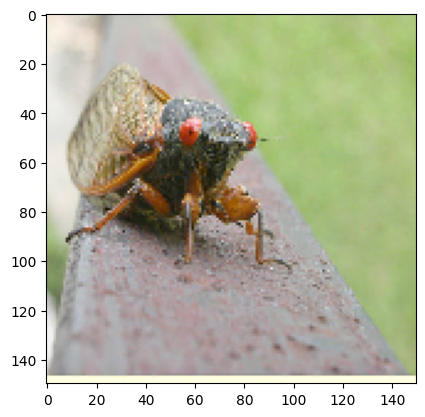

1/1 [==============================] - 0s 56ms/step
Bo dat


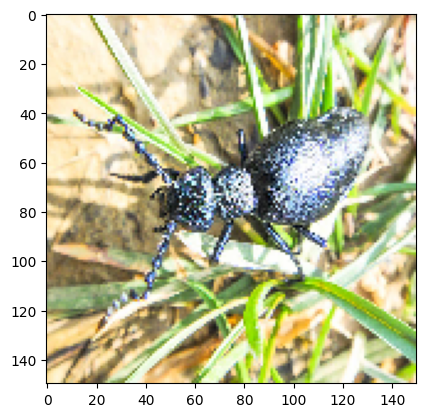

1/1 [==============================] - 0s 63ms/step
Bo dat


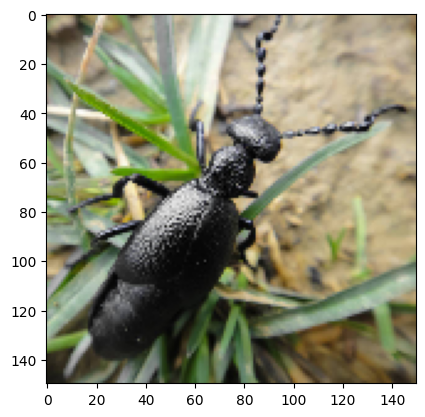

1/1 [==============================] - 0s 60ms/step
Ve sau


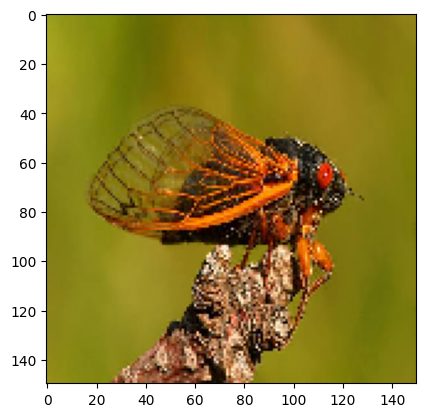

1/1 [==============================] - 0s 78ms/step
Ve sau


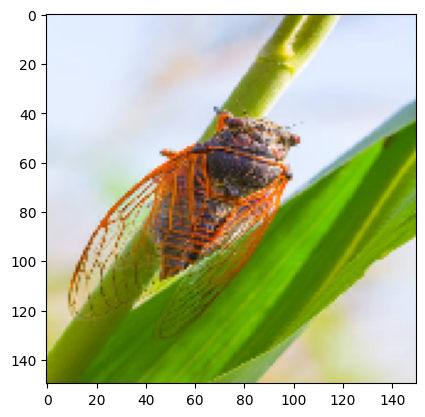

1/1 [==============================] - 0s 59ms/step
Bo ngua


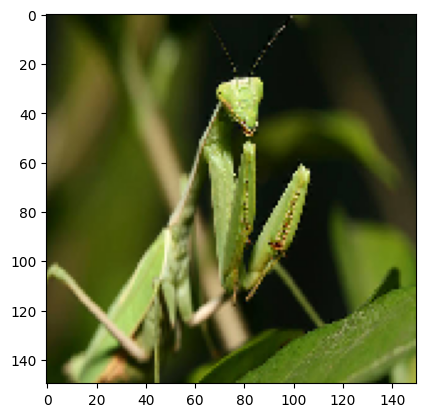

In [11]:
folder="/content/drive/MyDrive/Datacuoiki/Test"

for i in os.listdir(folder):
  img=load_img(folder+'/'+i,target_size=(150,150))
  plt.imshow(img)
  img=img_to_array(img)
  img=img.astype('float32')
  img=img/255
  img=np.expand_dims(img,axis=0)
  result=(model_1.predict(img).argmax())
  class_name=['Bo dat','Bo ngua','Bo rua','Buom','Chuong chuong','Kien','Ong','Ruoi','Ve sau']
  print(class_name[result])
  plt.show()

In [13]:
# Lưu 
model.save("/content/drive/MyDrive/Nhandangcontrung.h5")

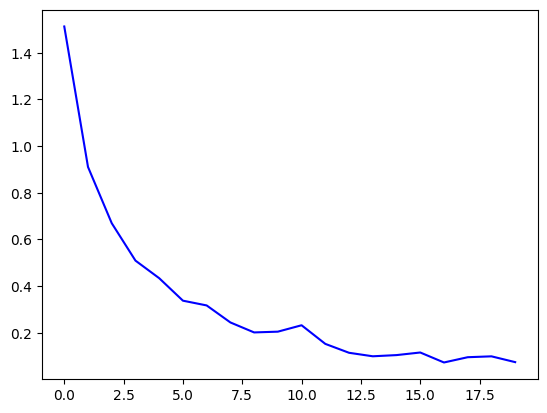

In [12]:
#Vẽ biểu đồ thể hiện sự mất mát qua số lần train
accuracy = train.history['accuracy']
loss = train.history['loss']
epochs = range(len(accuracy))
plt.plot(epochs,loss,'b',label='Training loss')
plt.show()